<a href="https://colab.research.google.com/github/7-youssef/DEPI-Final_Project/blob/main/EDA_Medical_Report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Metric Used**

Here we will be using [BLEU](https://towardsdatascience.com/bleu-bilingual-evaluation-understudy-2b4eab9bcfd1) score as  the metric. BLEU score compares each word in the predicted sentence and compare it to the reference sentence (It is also done in n-grams) and returns score based on how many words were predicted that were in the original sentence. BLEU score is not a good metric to compare the performance of translation since simililar words that have the same meaning will be penalized. So we will not only use n-gram BLEU score but also take a sample of the predicted captions and compare it to the original reference caption manually.

In [ ]:
!pip install wordcloud


# **Dataset Used**
Here I will be taking a publicly available dataset from Indiana University which consists of chest X-ray [images](https://academictorrents.com/details/5a3a439df24931f410fac269b87b050203d9467d) and [reports](https://academictorrents.com/details/66450ba52ba3f83fbf82ef9c91f2bde0e845aba9) (in XML format) which contain information regarding the findings and impression of the X-ray. The goal is to predict the impressions of the medical report attached to the images.

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import cv2
from google.colab.patches import cv2_imshow
import re
from bs4 import BeautifulSoup #for reading xml file
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS  #for plotting wordcloud
from tqdm import tqdm

# **Exploratory Data Analysis**

## **Images**

In [ ]:
!kaggle datasets download -d raddar/chest-xrays-indiana-university

Dataset URL: https://www.kaggle.com/datasets/raddar/chest-xrays-indiana-university
License(s): Attribution-NonCommercial-NoDerivatives 4.0 International (CC BY-NC-ND 4.0)
100% 13.2G/13.2G [02:42<00:00, 148MB/s]
100% 13.2G/13.2G [02:42<00:00, 87.2MB/s]


In [ ]:
!unzip chest-xrays-indiana-university.zip

Streaming output truncated to the last 5000 lines.
  inflating: images/images_normalized/219_IM-0799-1001.dcm.png  
  inflating: images/images_normalized/219_IM-0799-2001.dcm.png  
  inflating: images/images_normalized/21_IM-0729-1001-0001.dcm.png  
  inflating: images/images_normalized/21_IM-0729-1001-0002.dcm.png  
  inflating: images/images_normalized/2200_IM-0811-1001.dcm.png  
  inflating: images/images_normalized/2200_IM-0811-2001.dcm.png  
  inflating: images/images_normalized/2201_IM-0811-1002.dcm.png  
  inflating: images/images_normalized/2202_IM-0811-1001.dcm.png  
  inflating: images/images_normalized/2202_IM-0811-1002.dcm.png  
  inflating: images/images_normalized/2203_IM-0812-1001.dcm.png  
  inflating: images/images_normalized/2203_IM-0812-2001.dcm.png  
  inflating: images/images_normalized/2204_IM-0813-1001.dcm.png  
  inflating: images/images_normalized/2204_IM-0813-1002.dcm.png  
  inflating: images/images_normalized/2205_IM-0814-1001.dcm.png  
  inflating: images/i

In [ ]:
image_folder = '/content/images/images_normalized' #path to folder containing images
total_images = len(os.listdir(image_folder))
print('The number of images in data are: %i'%(total_images))

The number of images in data are: 7470


1)



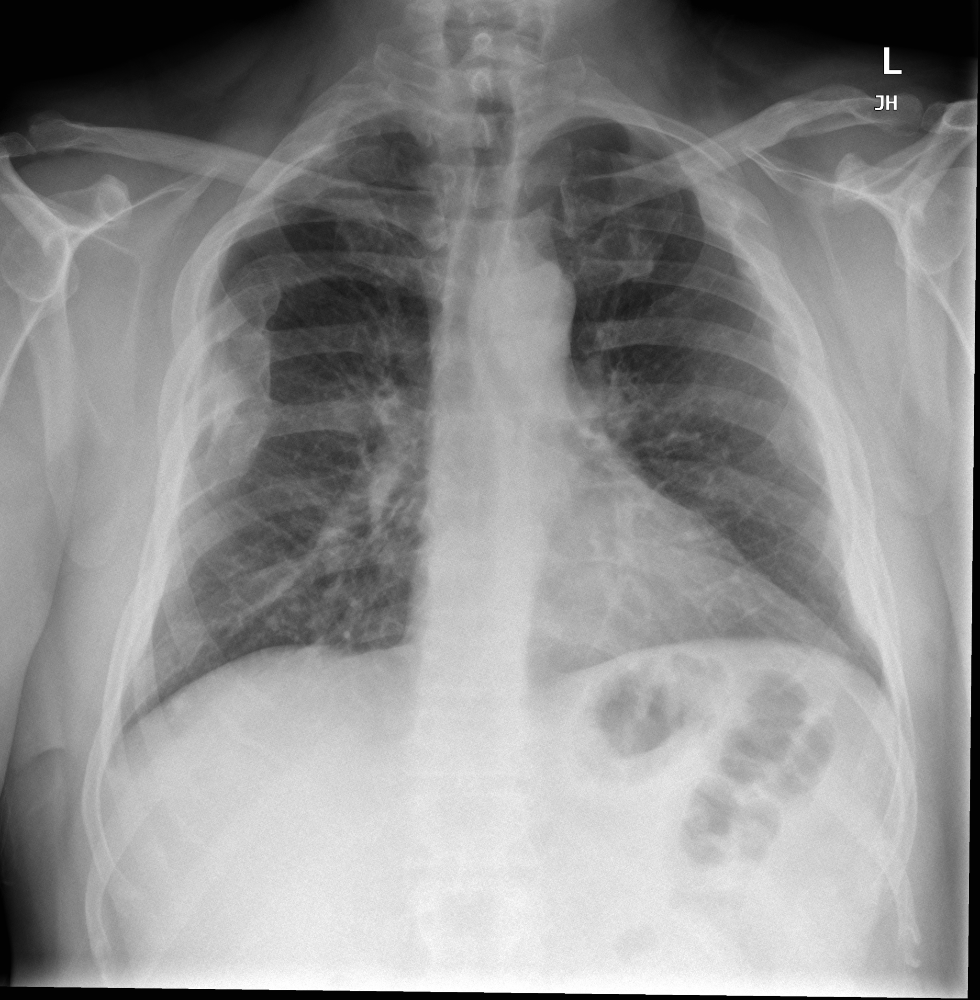

		 3408_IM-1648-1001.dcm.png
2)



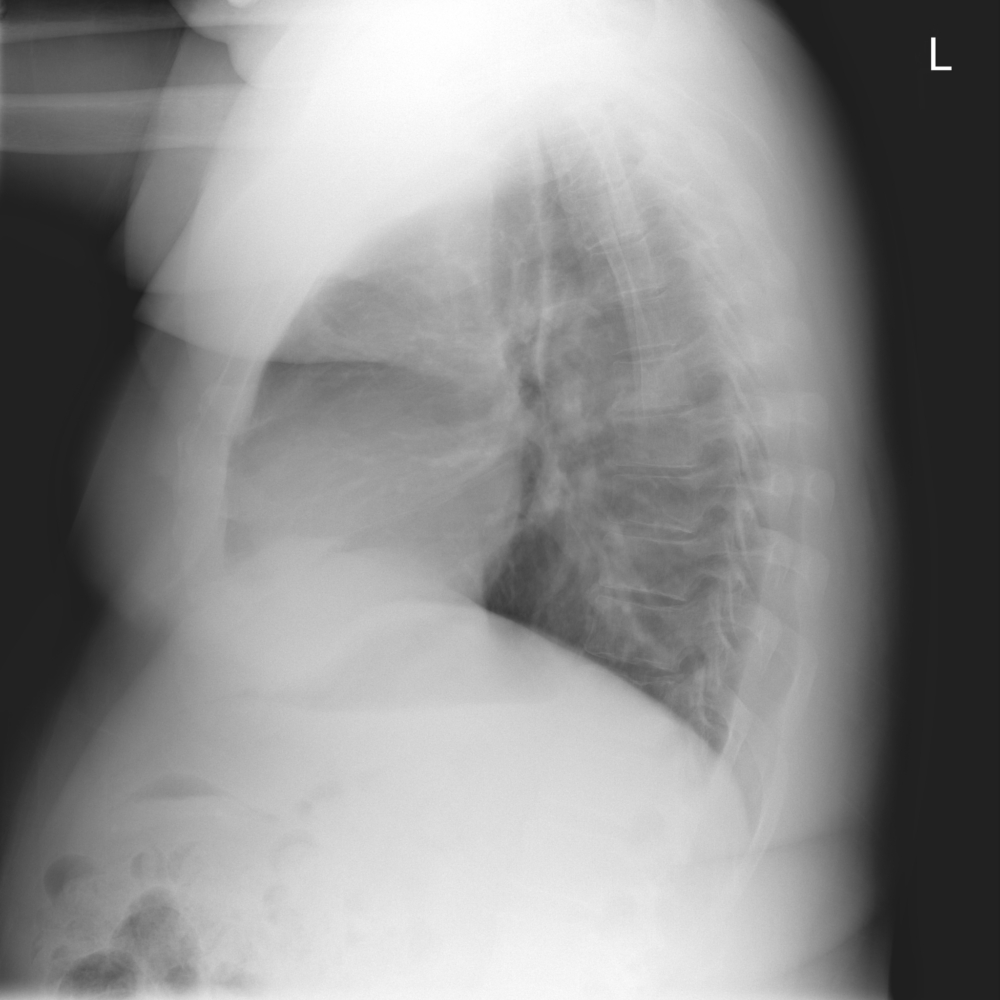

		 2776_IM-1217-2001.dcm.png
3)



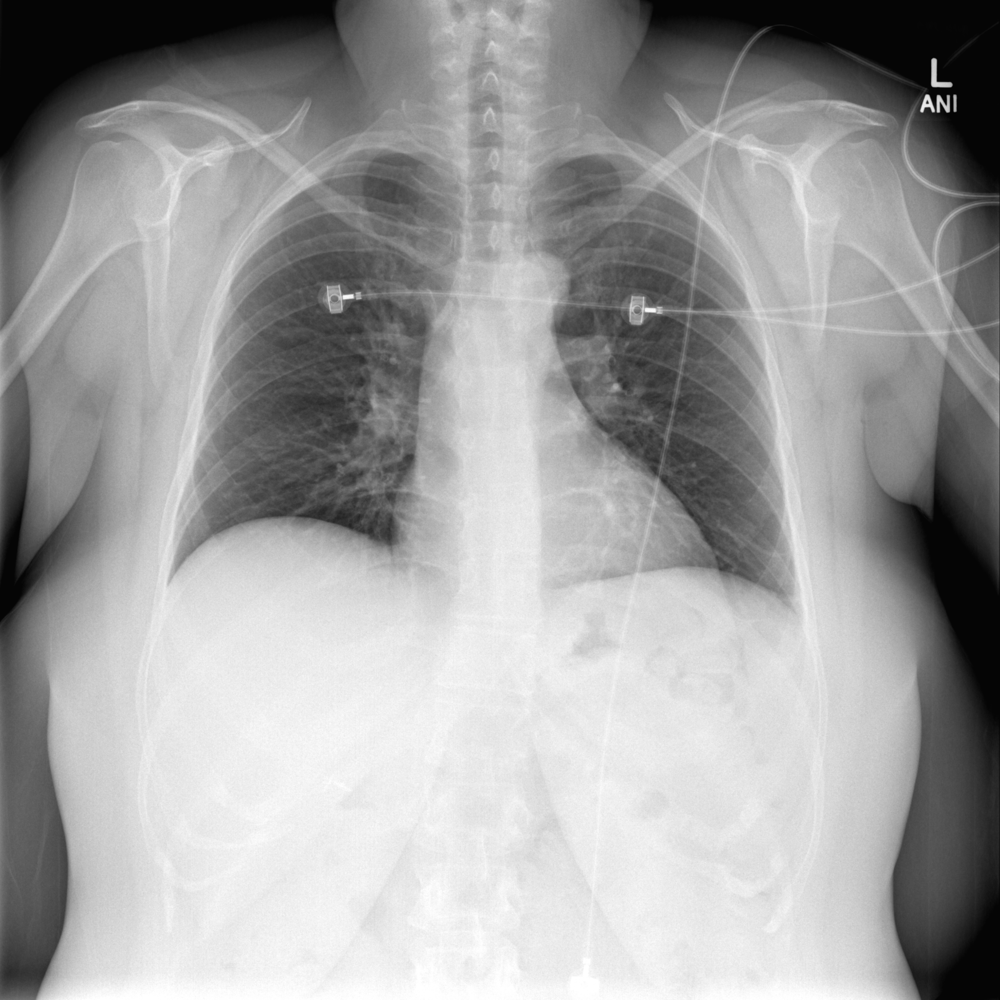

		 3403_IM-1647-1001.dcm.png


In [ ]:
#showing random 3 sample images
np.random.seed(420)
for i in range(3): #print 5 sample images
  k = np.random.choice(range(total_images))
  image_file = os.listdir(image_folder)[k]
  image = cv2.imread(os.path.join(image_folder,image_file)) #getting an image file
  print("%i)\n"%(i+1))
  cv2_imshow(image)
  print("\t\t",image_file) #the image file name

We can see 3 sample images of the dataset. These are chest X_rays which are taken in  front and side view.

## **Reports**

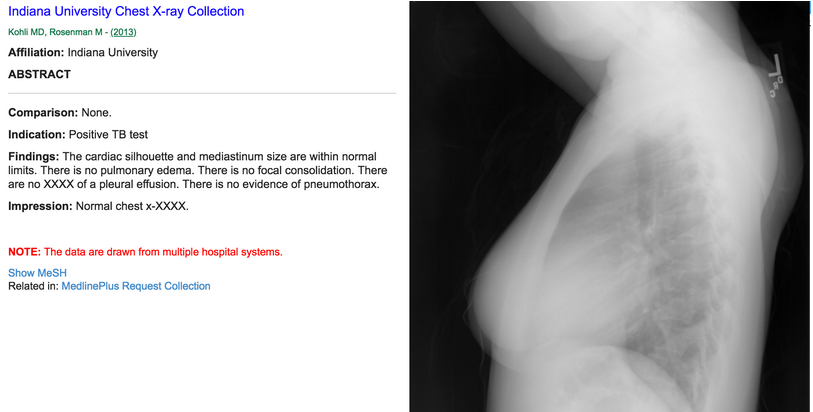

This is  a sample report. The report is stored in xml format. We will extract comparison, indication,findings and impression part of the report.

In [ ]:
reports_folder = "/content/indiana_reports.csv"
total_reports = pd.read_csv(reports_folder)
total_reports.shape

(3851, 8)

In [ ]:
total_reports.tail(1).T

,3850
uid,3999
MeSH,normal
Problems,normal
image,"CHEST PA and LATERAL: on XXXX, XXXX."
indication,This is a XXXX-year-old female patient with sh...
comparison,"Chest x-XXXX, XXXX, XXXX."
findings,NaN
impression,The cardiac silhouette is normal in size and c...


In [ ]:
import re
# Read in the projections data
projections = pd.read_csv('/content/indiana_projections.csv')

# Read in the reports data
reports = pd.read_csv('/content/indiana_reports.csv')

# Define the path to the images folder
images_folder = '/content/images/images_normalized'

# Merge the projections and reports data on the UID column
reports = pd.merge(projections, reports, on='uid')

# Create a dictionary of image filenames and their corresponding captions
data = {}
for i in range(len(reports)):
    filename = reports.loc[i, 'filename']
    caption = reports.loc[i, 'impression']
    if filename not in data:
        data[filename] = []
    if isinstance(caption, str) and re.match(r'^\d+\.', caption):
        data[filename].append(caption.split('. ')[1])
    else:
        if data[filename]:
            data[filename][-1] += " " + caption
        else:
            data[filename].append(caption)

In [ ]:
# Converting dictionary to DataFrame
df = pd.DataFrame(list(data.items()), columns=['image', 'findings'])

# Grouping every two consecutive rows together
grouped_data = []
for i in range(0, len(df), 2):
    image_1 = df.iloc[i]['image']
    image_2 = df.iloc[i+1]['image'] if i+1 < len(df) else None
    findings = df.iloc[i]['findings']  # Assuming findings are the same for the pair
    grouped_data.append([image_1, image_2, findings[0]])

# Creating a new DataFrame with combined rows
df_grouped = pd.DataFrame(grouped_data, columns=['image_1', 'image_2', 'findings'])

# Exporting to CSV
df_grouped.to_csv('combined_images_report.csv', index=False)

# For Colab, to download the CSV
from google.colab import files
files.download('combined_images_report.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df_grouped.shape

(3733, 3)

In [ ]:
df_grouped.head()

,image_1,image_2,findings
0,1_IM-0001-4001.dcm.png,1_IM-0001-3001.dcm.png,Normal chest x-XXXX.
1,2_IM-0652-1001.dcm.png,2_IM-0652-2001.dcm.png,No acute pulmonary findings.
2,3_IM-1384-1001.dcm.png,3_IM-1384-2001.dcm.png,"No displaced rib fractures, pneumothorax, or p..."
3,4_IM-2050-1001.dcm.png,4_IM-2050-2001.dcm.png,Bullous emphysema and interstitial fibrosis
4,5_IM-2117-1003002.dcm.png,5_IM-2117-1004003.dcm.png,No acute cardiopulmonary abnormality.


In [ ]:
import pandas as pd
import numpy as np
import re

# Function for decontraction of words
def decontracted(phrase):
    # Specific contractions
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # General contractions
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)

    return phrase

# Preprocess findings or other report fields
def preprocess_report_text(text):
    """
    Preprocesses the text for 'findings' or other report fields.
    Removes special characters, performs decontraction, and other cleanup.
    """
    if pd.isna(text):
        return np.nan

    # Remove numbers and unwanted characters
    text = re.sub(r"\d.", "", text)  # Removing numbers like "1.", "2.", etc.
    text = re.sub(r"X+", "", text)  # Removing sequences of "XXXX"
    text = re.sub(r" \.", "", text)  # Removing single full-stop spaces " ."
    text = re.sub(r"[^.a-zA-Z]", " ", text)  # Removing special characters except for periods
    text = re.sub(r"\.", " .", text)  # Adding space before periods for uniformity

    # Perform decontraction (e.g., "can't" -> "cannot")
    text = decontracted(text)

    # Lowercase and remove extra spaces
    text = text.strip().lower()
    text = " ".join(text.split())  # Remove excess whitespace

    if text == "":
        return np.nan
    return text

# Function to combine every two rows into one
def combine_rows(df):
    combined_data = []

    for i in range(0, len(df), 2):
        # Fetch image_1 and image_2 from consecutive rows
        image_1 = df.iloc[i]['image_1']
        image_2 = df.iloc[i + 1]['image_1'] if i + 1 < len(df) else np.nan

        # Fetch the findings from the first row (assuming they are similar in pairs)
        findings_1 = df.iloc[i]['findings']
        findings_2 = df.iloc[i + 1]['findings'] if i + 1 < len(df) else np.nan

        # Preprocess the findings for both rows
        findings = preprocess_report_text(findings_1)
        if pd.isna(findings):
            findings = preprocess_report_text(findings_2)

        # Append combined information to the list
        combined_data.append([image_1, image_2, findings])

    # Create a new DataFrame with combined information
    df_combined = pd.DataFrame(combined_data, columns=['image_1', 'image_2', 'findings'])

    return df_combined

# Example: Assume df_grouped is the existing DataFrame you're working with
# df_grouped = pd.DataFrame(...)  # Your existing DataFrame

# Now, apply the row combination and preprocessing
df_combined = combine_rows(df_grouped)

# Save or inspect the combined DataFrame
df_combined.to_csv('combined_images_report.csv', index=False)
print(df_combined.head())


                     image_1                  image_2  \
0     1_IM-0001-4001.dcm.png   2_IM-0652-1001.dcm.png   
1     3_IM-1384-1001.dcm.png   4_IM-2050-1001.dcm.png   
2  5_IM-2117-1003002.dcm.png   6_IM-2192-1001.dcm.png   
3     7_IM-2263-1001.dcm.png   8_IM-2333-1001.dcm.png   
4     9_IM-2407-1001.dcm.png  10_IM-0002-2001.dcm.png   

                                            findings  
0                                   normal chest x .  
1  no displaced rib fractures pneumothorax or ple...  
2             no acute cardiopulmonary abnormality .  
3  basilar atelectasis . no confluent lobar conso...  
4  increased size of density in the left cardioph...  


In [ ]:
df_combined.head()

,image_1,image_2,findings
0,1_IM-0001-4001.dcm.png,2_IM-0652-1001.dcm.png,normal chest x .
1,3_IM-1384-1001.dcm.png,4_IM-2050-1001.dcm.png,no displaced rib fractures pneumothorax or ple...
2,5_IM-2117-1003002.dcm.png,6_IM-2192-1001.dcm.png,no acute cardiopulmonary abnormality .
3,7_IM-2263-1001.dcm.png,8_IM-2333-1001.dcm.png,basilar atelectasis . no confluent lobar conso...
4,9_IM-2407-1001.dcm.png,10_IM-0002-2001.dcm.png,increased size of density in the left cardioph...


Now we check for missing values.

In [ ]:
print("columns\t\t%missing values")
print('-'*30)
print(df.isnull().sum()*100/df.shape[0] )#percentage missing values

columns		%missing values
------------------------------
image       0.0
findings    0.0
dtype: float64


In [ ]:


def resize_images(df, image_folder, target_size=(512, 512)):


  for index, row in tqdm(df.iterrows(), total=df.shape[0]):
    image_path_1 = os.path.join(image_folder, row['image_1'])
    if os.path.exists(image_path_1):
      img = cv2.imread(image_path_1, cv2.IMREAD_GRAYSCALE)
      if img is not None:
        resized_img = cv2.resize(img, target_size)
        cv2.imwrite(image_path_1, resized_img)

    image_path_2 = os.path.join(image_folder, row['image_2'])
    if row['image_2'] is not None and os.path.exists(image_path_2):
      img = cv2.imread(image_path_2, cv2.IMREAD_GRAYSCALE)
      if img is not None:
        resized_img = cv2.resize(img, target_size)
        cv2.imwrite(image_path_2, resized_img)

# Example usage:
resize_images(df_combined, images_folder)

100%|██████████| 1867/1867 [03:31<00:00,  8.84it/s]


## **Sample Images + Caption**

We can see that indications are patients medical complaints while findings are the obervations from X-ray while impression is inference obtained. In this case study, I will try to predict the impression part of the medical report given the two images.

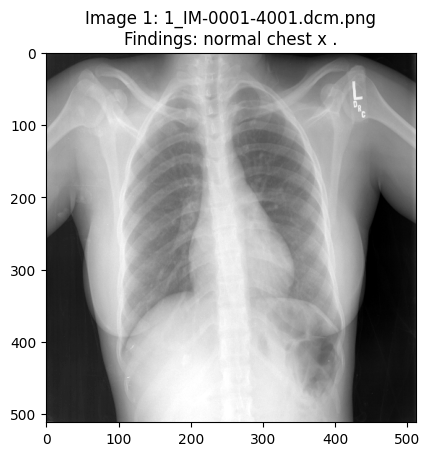

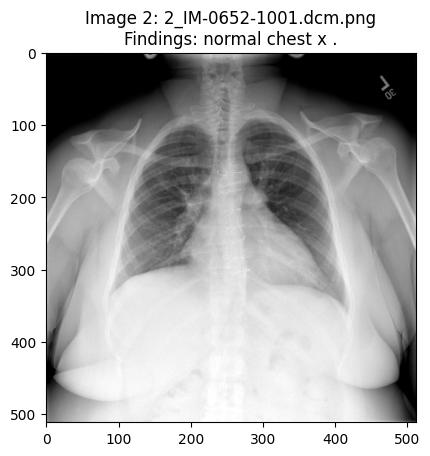

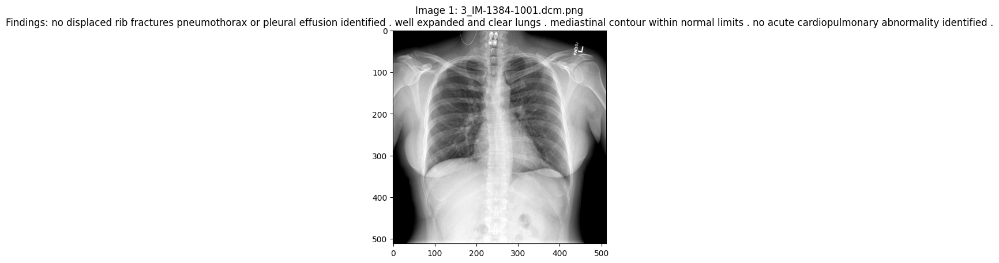

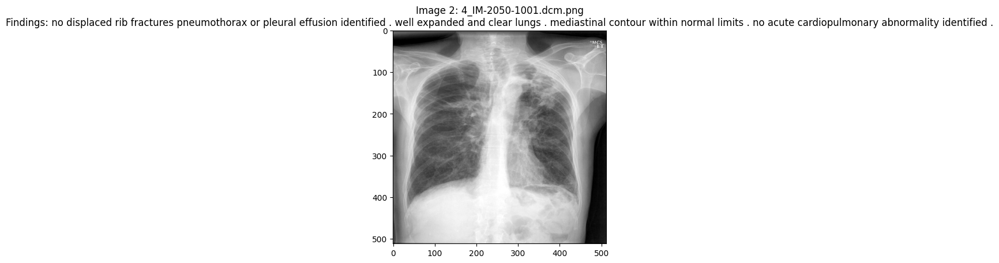

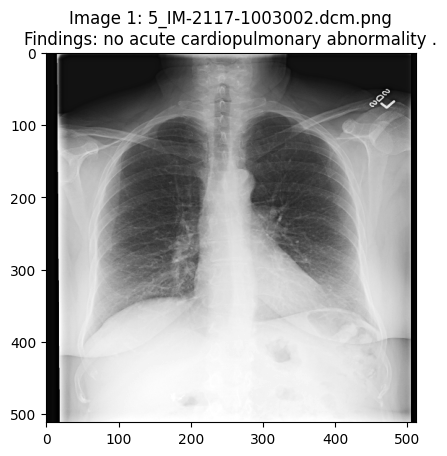

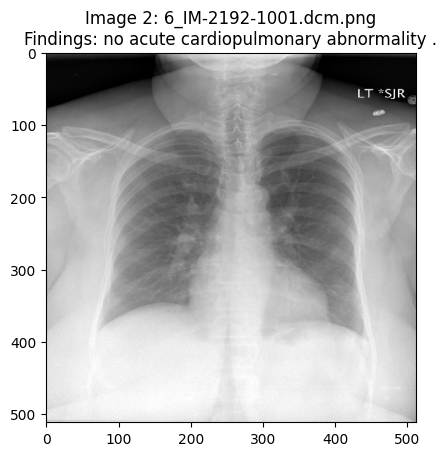

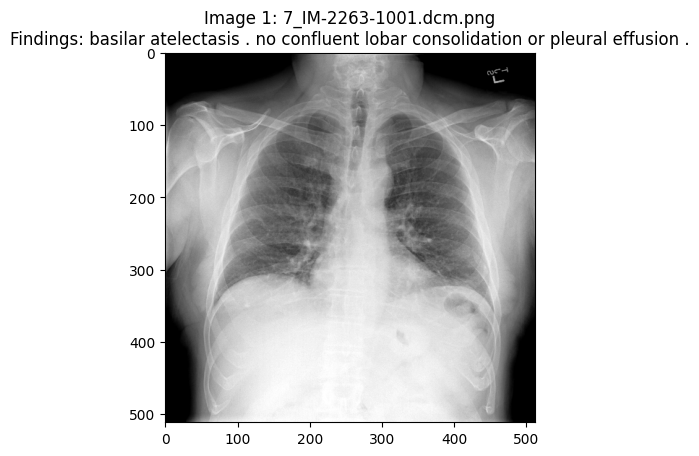

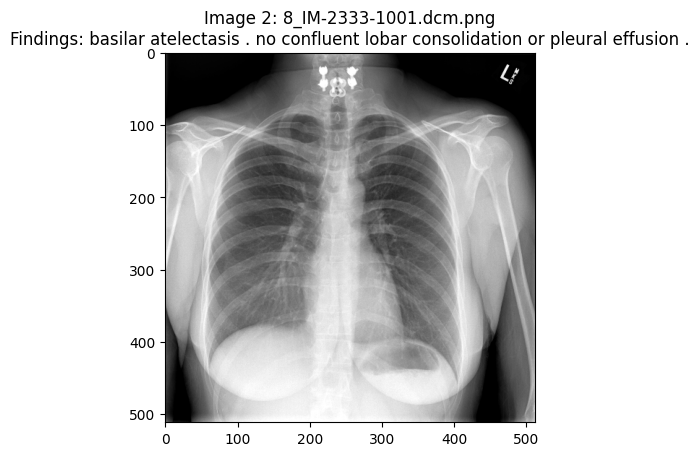

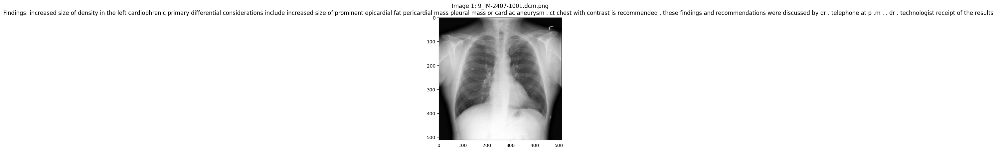

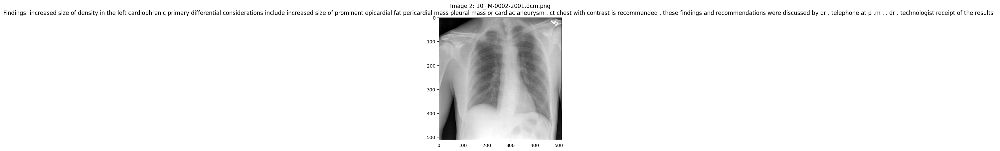

In [ ]:
# prompt: write code to show a sample of image with finding

import matplotlib.pyplot as plt
import os

def show_image_with_findings(df, image_folder, num_samples=5):
  """
  Displays a sample of images along with their corresponding findings.

  Args:
    df: DataFrame containing image filenames and findings.
    image_folder: Path to the folder where the images are stored.
    num_samples: Number of image samples to display.
  """
  for i in range(min(num_samples, len(df))):
    image_path_1 = os.path.join(image_folder, df['image_1'].iloc[i])
    if os.path.exists(image_path_1):
      img1 = plt.imread(image_path_1)
      plt.imshow(img1, cmap='gray')
      plt.title(f"Image 1: {df['image_1'].iloc[i]}\nFindings: {df['findings'].iloc[i]}")
      plt.show()

    image_path_2 = os.path.join(image_folder, df['image_2'].iloc[i])
    if df['image_2'].iloc[i] is not None and os.path.exists(image_path_2):
      img2 = plt.imread(image_path_2)
      plt.imshow(img2, cmap='gray')
      plt.title(f"Image 2: {df['image_2'].iloc[i]}\nFindings: {df['findings'].iloc[i]}")
      plt.show()


# Example usage:
show_image_with_findings(df_combined, images_folder)

### **Wordcloud of Impressions**

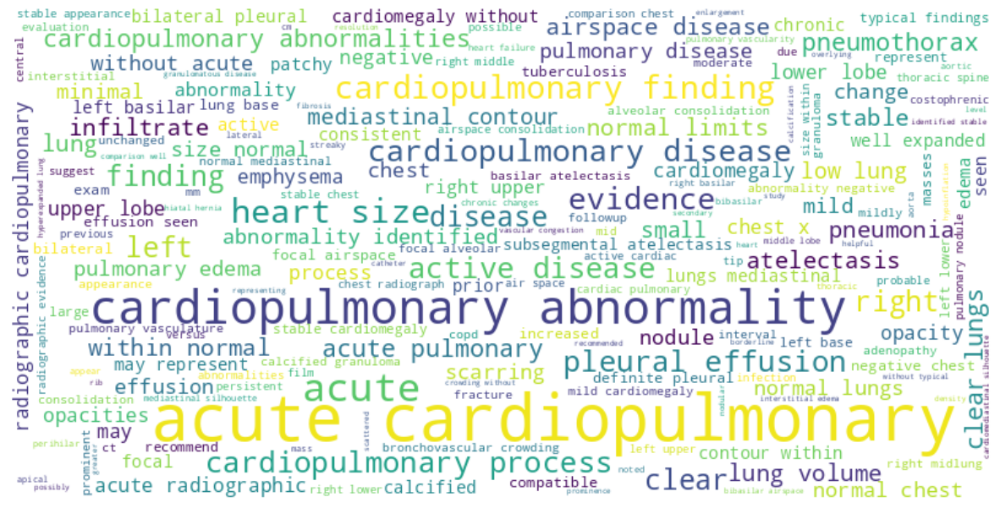

In [ ]:
# prompt: create wordcloud of impressions

# Create a string containing all impressions
text = " ".join(df_combined['findings'].dropna().astype(str))

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=STOPWORDS).generate(text)

# Display the generated image:
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()